# First steps

In [1]:
import sisl
# We define the root directory where our files are
siesta_files = sisl._environ.get_environ_variable("SISL_FILES_TESTS") / "sisl" / "io" / "siesta"

## Activating the viz framework

The first thing you will need to do in order to use plots is to import `sisl.viz`:

In [2]:
import sisl.viz
from sisl.viz import Plot

This will load the appropiate things into sisl to use the visualization tools. You can also control the loading of the framework with an environment variable:

```
SISL_VIZ_AUTOLOAD=True
```

will load the framework on `import sisl`, so you won't need to explicitly import it.

<div class="alert alert-info">
    
Note
    
If you use sisl to run high performance calculations where you initialize sisl frequently it's better to have the autoloading turned off (default), as it might introduce an overhead of about a second.
    
</div>

Now that the framework has been loaded, we can start plotting!

## My first plots

The most straightforward way to plot things in sisl is to call the `Plot` class, which you can import as shown in the next cell:

In [3]:
from sisl.viz import Plot

Plot(siesta_files / "SrTiO3.bands")

FigureWidget({
    'data': [{'hoverinfo': 'name',
              'hovertemplate': '%{y:.2f} eV',
              'line': {'color': 'black', 'width': 1.0},
              'mode': 'lines',
              'name': '4',
              'opacity': 1,
              'type': 'scatter',
              'uid': '5c45bfbb-20d1-43c8-971c-3fef4c562393',
              'x': array([0.      , 0.019506, 0.039012, 0.058518, 0.078024, 0.09753 , 0.117036,
                          0.136542, 0.156048, 0.175554, 0.19506 , 0.214566, 0.234072, 0.253578,
                          0.273084, 0.29259 , 0.312096, 0.331602, 0.351108, 0.370614, 0.39012 ,
                          0.409626, 0.429132, 0.448638, 0.468144, 0.48765 , 0.507156, 0.526662,
                          0.546168, 0.565674, 0.58518 , 0.604686, 0.624192, 0.643698, 0.663204,
                          0.68271 , 0.702217, 0.721723, 0.741229, 0.760735, 0.780241, 0.799747,
                          0.819253, 0.838759, 0.858265, 0.876655, 0.895046, 0.913436, 0.9318

Note how we just passed the path to our bands file and **sisl recognized what was the plot that we wanted to generate**.

Let's try now passing a *.RHO* file to check the electronic density:

In [4]:
Plot(siesta_files / "SrTiO3.RHO", axes="xy", nsc=[2,1,1], zsmooth='best')

FigureWidget({
    'data': [{'name': 'SrTiO3.RHO',
              'type': 'heatmap',
              'uid': '46d2e965-6328-454e-9c23-b644f5a1ceb2',
              'x': array([0.        , 0.08070837, 0.16141673, 0.2421251 , 0.32283346, 0.40354183,
                          0.48425019, 0.56495856, 0.64566692, 0.72637529, 0.80708365, 0.88779202,
                          0.96850039, 1.04920875, 1.12991712, 1.21062548, 1.29133385, 1.37204221,
                          1.45275058, 1.53345894, 1.61416731, 1.69487568, 1.77558404, 1.85629241,
                          1.93700077, 2.01770914, 2.0984175 , 2.17912587, 2.25983423, 2.3405426 ,
                          2.42125096, 2.50195933, 2.5826677 , 2.66337606, 2.74408443, 2.82479279,
                          2.90550116, 2.98620952, 3.06691789, 3.14762625, 3.22833462, 3.30904299,
                          3.38975135, 3.47045972, 3.55116808, 3.63187645, 3.71258481, 3.79329318,
                          3.87400154, 3.95470991, 4.03541827, 4.1161266

You probably noticed that we used some extra arguments (`axes`, `nsc`, `zsmooth`) to get the exact plot that we wanted. These arguments are called **settings**. Settings define how the plot will process and show your plot. You can **provide settings on initialization or update them later**. 

`Plot()` returns a plot object. If you want to keep that plot object for later (to do any modification on it) you will have to, of course, store it in a variable. Let's do that:

In [5]:
rho_plot = Plot(siesta_files / "SrTiO3.RHO", axes="xy", nsc=[2,1,1], zsmooth="best")

And now that we have it, let's try to get some help from it to understand the plot object better.

In [6]:
print(rho_plot.__class__)
print(rho_plot.__doc__)

<class 'sisl.viz.plots.grid.GridPlot'>

    Versatile visualization tool for any kind of grid.

    Parameters
    ------------
    grid: Grid, optional
        A sisl.Grid object. If provided, grid_file is ignored.
    grid_file: cubeSile or rhoSileSiesta or ldosSileSiesta or rhoinitSileSiesta or rhoxcSileSiesta or drhoSileSiesta or baderSileSiesta or iorhoSileSiesta or totalrhoSileSiesta or stsSileSiesta or stmldosSileSiesta or hartreeSileSiesta or neutralatomhartreeSileSiesta or totalhartreeSileSiesta or gridncSileSiesta or ncSileSiesta or fdfSileSiesta or tsvncSileSiesta or chgSileVASP or locpotSileVASP, optional
        A filename that can be return a Grid through `read_grid`.
    represent:  optional
        The representation of the grid that should be displayed
    transforms:  optional
        Transformations to apply to the whole grid.             It can be a
        function, or a string that represents the path             to a
        function (e.g. "scipy.exp"). If a stri

We can see two interesting things:

- Our plot is a `GridPlot`, not simply a `Plot`. This means that **it knows you are dealing with a grid** and consequently it will help you by **providing useful methods and settings**.
- On the documentation, under `Parameters`, you can see the arguments that this plot understands. If you've guessed these are the so-called *settings*, then you've guessed right! A way to know the current settings of your plot is to check the `settings` attribute:


In [7]:
rho_plot.settings

{'grid': None,
 'grid_file': <sisl.io.siesta.binaries.rhoSileSiesta at 0x7efdce9bde10>,
 'represent': 'real',
 'transforms': [],
 'axes': 'xy',
 'zsmooth': 'best',
 'interp': [1, 1, 1],
 'transform_bc': 'wrap',
 'nsc': [2, 1, 1],
 'offset': [0, 0, 0],
 'trace_name': None,
 'x_range': None,
 'y_range': None,
 'z_range': None,
 'crange': [None, None],
 'cmid': None,
 'colorscale': None,
 'reduce_method': 'average',
 'isos': [],
 'plot_geom': False,
 'geom_kwargs': {},
 'root_fdf': None,
 'results_path': '',
 'entry_points_order': ['grid', 'grid file'],
 'backend': 'plotly'}

The names might already give you a quick intuition of what each setting does, but for more detail you can go to the documentation. The **showcase notebooks** show examples and are designed to **help you understand what each setting does in a visual way**. It is always worth checking them out if you are dealing with a new plot type!

One of the interesting methods that grid plots have is the `scan` method. Here we use it to do a simple scan of 15 steps with the default settings, but you can play with it:

In [8]:
rho_plot.scan(along="z", num=15)

## Plotable objects

In this section we'd like to point out that using the `Plot` class is not the most convenient thing for day to day usage. Instead, everything that is *plotable* in `sisl` will receive a `plot` method that you can use. One example of a plotable object is the `bandsSileSiesta`:

In [9]:
bands_sile = sisl.get_sile(siesta_files/"SrTiO3.bands")
bands_sile.plot()

FigureWidget({
    'data': [{'hoverinfo': 'name',
              'hovertemplate': '%{y:.2f} eV',
              'line': {'color': 'black', 'width': 1.0},
              'mode': 'lines',
              'name': '4',
              'opacity': 1,
              'type': 'scatter',
              'uid': '825c409d-5898-4bd7-882b-07d5cd03207a',
              'x': array([0.      , 0.019506, 0.039012, 0.058518, 0.078024, 0.09753 , 0.117036,
                          0.136542, 0.156048, 0.175554, 0.19506 , 0.214566, 0.234072, 0.253578,
                          0.273084, 0.29259 , 0.312096, 0.331602, 0.351108, 0.370614, 0.39012 ,
                          0.409626, 0.429132, 0.448638, 0.468144, 0.48765 , 0.507156, 0.526662,
                          0.546168, 0.565674, 0.58518 , 0.604686, 0.624192, 0.643698, 0.663204,
                          0.68271 , 0.702217, 0.721723, 0.741229, 0.760735, 0.780241, 0.799747,
                          0.819253, 0.838759, 0.858265, 0.876655, 0.895046, 0.913436, 0.9318

Although the `plot` attribute is not exactly a method, but **a manager that organizes all the plotting possibilities for an object**. If you call it, as we did, you get the default plot, but you can specify which plot type you want specifically:

In [10]:
bands_sile.plot.bands(bands_color="red")

FigureWidget({
    'data': [{'hoverinfo': 'name',
              'hovertemplate': '%{y:.2f} eV',
              'line': {'color': 'red', 'width': 1.0},
              'mode': 'lines',
              'name': '4',
              'opacity': 1,
              'type': 'scatter',
              'uid': 'd7639fa4-372f-4435-a664-add3dc8e271a',
              'x': array([0.      , 0.019506, 0.039012, 0.058518, 0.078024, 0.09753 , 0.117036,
                          0.136542, 0.156048, 0.175554, 0.19506 , 0.214566, 0.234072, 0.253578,
                          0.273084, 0.29259 , 0.312096, 0.331602, 0.351108, 0.370614, 0.39012 ,
                          0.409626, 0.429132, 0.448638, 0.468144, 0.48765 , 0.507156, 0.526662,
                          0.546168, 0.565674, 0.58518 , 0.604686, 0.624192, 0.643698, 0.663204,
                          0.68271 , 0.702217, 0.721723, 0.741229, 0.760735, 0.780241, 0.799747,
                          0.819253, 0.838759, 0.858265, 0.876655, 0.895046, 0.913436, 0.931826

One can quickly check what are the options:

In [11]:
dir(bands_sile.plot)

['bands', 'fatbands', 'register', 'renew']

And you then see that there's the option to plot the fatbands from this object. We won't do it here because it needs the `.WFSX` file, which we don't have.

## Updating your plots

As we mentioned earlier, **plots have settings and they can be updated**. This stems from the fact that the framework is designed with GUIs in mind, where the user will have visual input fields that they may tweak to see how the plot changes. So you might do as if you were interacting from a GUI and update the settings:

In [12]:
rho_plot.update_settings(z_range=[1, 3], axes="xyz", isos=[{"frac": 0.05, "color":"lightgreen", "opacity": 0.3}])

FigureWidget({
    'data': [{'color': 'lightgreen',
              'i': array([    2,     2,     6, ..., 14310, 14425, 14427], dtype=int32),
              'j': array([    1,     3,     5, ..., 14426, 14311, 14311], dtype=int32),
              'k': array([    0,     1,     4, ..., 14424, 14309, 14425], dtype=int32),
              'name': 'Iso=0.4997',
              'opacity': 0.3,
              'showlegend': True,
              'type': 'mesh3d',
              'uid': 'bfaa13cd-8c88-4112-8527-a34ed59ac952',
              'x': array([0.        , 0.08070837, 0.        , ..., 7.66729472, 7.66729472,
                          7.66729472]),
              'y': array([0.        , 0.        , 0.08070837, ..., 3.71258481, 3.79329318,
                          3.79329318]),
              'z': array([0.05777172, 0.0549085 , 0.0549085 , ..., 1.89409336, 0.05199051,
                          1.88501034])}],
    'layout': {'legend': {'orientation': 'h'},
               'scene': {'aspectmode': 'data',
  

The most important thing is that, by the time we do this update, the *.RHO* file could have changed its location or even disappeared and it wouldn't matter. When you update a setting, **the plot reruns only from the point where that setting is used**. This **avoids rerunning time-consuming initializations** like reading a very big file or diagonalizing a hamiltonian.

However, this is not the only useful point. Since **plots are self-contained**, you can **share this plot with someone else and they will be able to tweak all the settings** that they wish if they don't involve reading data again. Isn't this nice? This brings us to the next section. 

## Storing and loading plots

After a time-consuming calculation or data reading, you clearly want your results to be saved. Plots provide a `save` method:

In [13]:
rho_plot.save("rho_plot.plot")

True

As discussed in the last paragraph of the previous section this **stores not only the current visualization**, but the full self contained plot that you can tweak as you wish when you load it again:

In [14]:
rho_plot_from_colleague = sisl.viz.load("rho_plot.plot")

And do whatever you want with it:

In [15]:
rho_plot_from_colleague.update_settings(axes="x")

FigureWidget({
    'data': [{'mode': 'lines',
              'name': 'SrTiO3.RHO',
              'opacity': 1,
              'type': 'scatter',
              'uid': '9a1f5b9c-d67a-4069-b34c-19a46da6b41a',
              'x': array([0.        , 0.08070837, 0.16141673, 0.2421251 , 0.32283346, 0.40354183,
                          0.48425019, 0.56495856, 0.64566692, 0.72637529, 0.80708365, 0.88779202,
                          0.96850039, 1.04920875, 1.12991712, 1.21062548, 1.29133385, 1.37204221,
                          1.45275058, 1.53345894, 1.61416731, 1.69487568, 1.77558404, 1.85629241,
                          1.93700077, 2.01770914, 2.0984175 , 2.17912587, 2.25983423, 2.3405426 ,
                          2.42125096, 2.50195933, 2.5826677 , 2.66337606, 2.74408443, 2.82479279,
                          2.90550116, 2.98620952, 3.06691789, 3.14762625, 3.22833462, 3.30904299,
                          3.38975135, 3.47045972, 3.55116808, 3.63187645, 3.71258481, 3.79329318,
            

In [16]:
# Let's clean the working directory.
import os
os.remove("rho_plot.plot")

You might ask yourself now what happens if you just want to store the representation, not the full self-contained plot. For this, we first need to discuss the next section.

## Different plotting backends

Hidden between all the settings, you can find a **very special setting**: `backend`.

Initially, the visualization framework was written to plot things using `plotly`. However, we noticed that this might not be the appropiate choice for everyone. Therefore, we changed the design to make it very modular and **allow rendering the plot with any framework you like**. There's a dedicated notebook on how to register your own backends. Here however we just want to show you **how you can switch between the sisl-provided backends**. It is very simple:

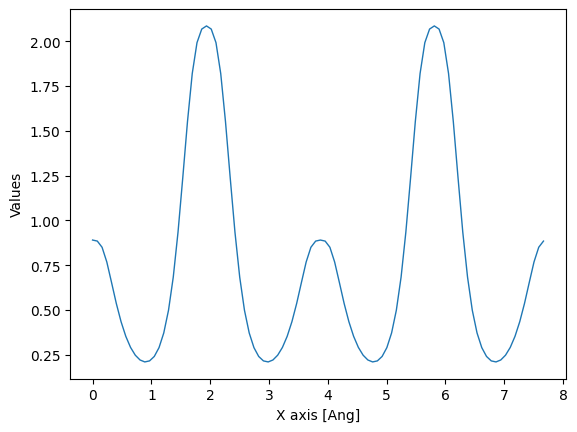

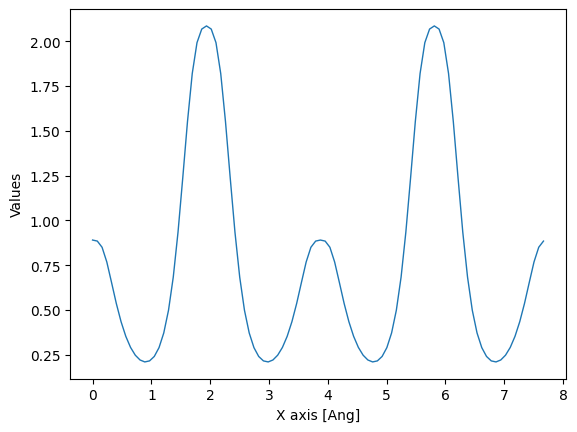

In [17]:
rho_plot_from_colleague.update_settings(backend="matplotlib", axes="x")

In [18]:
rho_plot_from_colleague.update_settings(backend="plotly", axes="xy")

FigureWidget({
    'data': [{'name': 'SrTiO3.RHO',
              'type': 'heatmap',
              'uid': '1b5a53bf-63ec-402b-9560-44c73ebe572e',
              'x': array([0.        , 0.08070837, 0.16141673, 0.2421251 , 0.32283346, 0.40354183,
                          0.48425019, 0.56495856, 0.64566692, 0.72637529, 0.80708365, 0.88779202,
                          0.96850039, 1.04920875, 1.12991712, 1.21062548, 1.29133385, 1.37204221,
                          1.45275058, 1.53345894, 1.61416731, 1.69487568, 1.77558404, 1.85629241,
                          1.93700077, 2.01770914, 2.0984175 , 2.17912587, 2.25983423, 2.3405426 ,
                          2.42125096, 2.50195933, 2.5826677 , 2.66337606, 2.74408443, 2.82479279,
                          2.90550116, 2.98620952, 3.06691789, 3.14762625, 3.22833462, 3.30904299,
                          3.38975135, 3.47045972, 3.55116808, 3.63187645, 3.71258481, 3.79329318,
                          3.87400154, 3.95470991, 4.03541827, 4.1161266

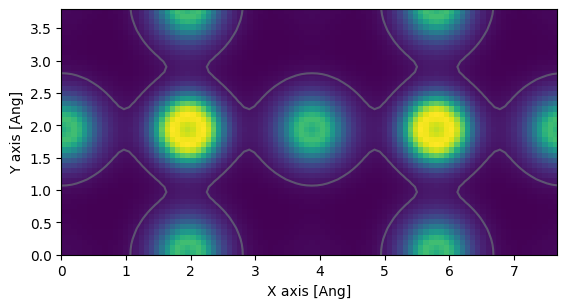

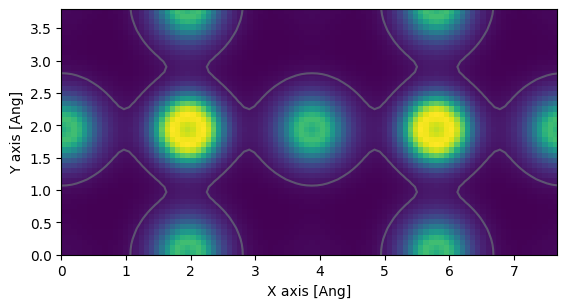

In [19]:
rho_plot_from_colleague.update_settings(backend="matplotlib")

Note that you can always know what backends are available for the plot by checking the options of the `backend` parameter:

In [20]:
rho_plot_from_colleague.get_param("backend").options

['plotly', 'matplotlib']

Note that the options here will only show the backends that have been loaded. `sisl` only **loads backends if the required python packages are present**. Currently, `sisl` provides backends for three frameworks: `plotly`, `matplotlib` and `blender`.

If you have one backend selected, you will have available all the methods that the framework provides. For example, if you are using the `matplotlib` backend, you can use all the methods that matplotlib implements for the `Axes` object directly on the plot. You also have the figure (axes) under the `figure` (`axes`) attribute, for whatever you want to do.

Let's for example draw a line, using `Axes.plot`:

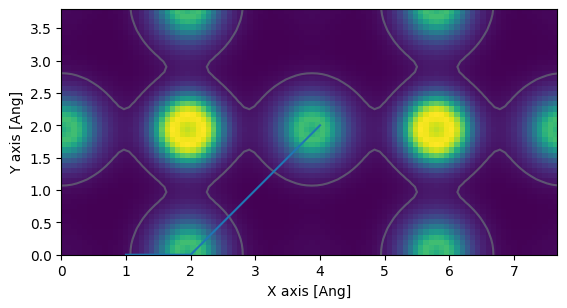

In [21]:
rho_plot_from_colleague.plot([1,2,3,4], [0,0,1,2])
rho_plot_from_colleague

And now let's do the same with `plotly`. In this case, all methods are looked for in the `Figure` object that is stored under the `figure` attribute.

In [22]:
rho_plot_from_colleague.update_settings(backend="plotly")
rho_plot_from_colleague.add_scatter(x=[1,2,3,4], y=[0,0,1,2])

At this point, you probably already know how you will be able to save these plots to images, html or whatever other format. Use **the methods that each framework provides**!

Also, this will also allow you to modify the plot as you wish (*adding lines, changing titles, showing legends...*) once `sisl` has render it. Again, you just have to use the methods that the framework provides to do so :)

## Discover more

Until here, we have covered the most basic concepts of the framework. If you enjoyed it, we encourage you to check the rest of notebooks to find out about more specific and complex aspects of it.

_______________
This next cell is just to create the thumbnail for the notebook in the docs

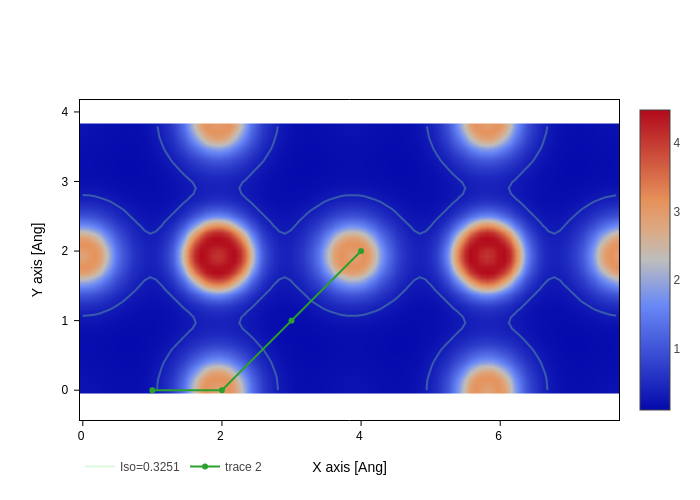

In [23]:
thumbnail_plot = rho_plot_from_colleague

if thumbnail_plot:
    thumbnail_plot.show("png")